# Hyperion temperature retrieval with MODTRAN-corrected spectra

## Load prerequisites, filepaths, libraries

Imports.

In [1]:
%matplotlib inline
import numpy as np
import h5py
import os.path
import random
import time
import pickle
import json
from itertools import izip_longest
import matplotlib as mpl
import matplotlib.pyplot as plt
from pygaarst import hyperionutils as hyp
from pygaarst import irutils as ir
import brewer2mpl

Set up plot options. 

In [2]:
bmap = brewer2mpl.get_map('Set1', 'qualitative', 7)
colors = bmap.mpl_colors
mpl.rcParams['axes.color_cycle'] = colors
mpl.rcParams.update({'font.size': 18, 'font.family': 'Calibri'})

/Users/cwaigl/miniconda3/envs/snakes/lib/python2.7/site-packages/matplotlib/__init__.py:800: MatplotlibDeprecationWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  mplDeprecation)


For interactive work, Pygaarst libraries need re-importing after editing.

Directory and file names.

In [3]:
basedir = "/Volumes/SCIENCE_mobile_Mac/Fire/DATA_BY_PROJECT/HyspIRI_Prep_2014/"
outdir = "/Volumes/SCIENCE_mobile_Mac/Fire/DATA_BY_PROJECT/HyspIRI_Prep_2014/visual/tmp/"

## MODTRAN plotting

In [14]:
modtran = "MODTRAN/crazy.tp7"
plotfile = os.path.join(basedir, modtran)

In [15]:
wavenum, transmiss = np.genfromtxt(plotfile, unpack=True, skip_header=12, usecols=(0, 1), skip_footer=1)

In [16]:
wavenum

array([  3995.,   3996.,   3997., ...,  28738.,  28739.,  28740.])

In [17]:
transmiss

array([ 0.    ,  0.0515,  0.145 , ...,  0.1447,  0.1447,  0.1447])

In [18]:
wav_mod = 1./wavenum * 1.e4

In [19]:
wav_mod

array([ 2.50312891,  2.5025025 ,  2.50187641, ...,  0.34797133,
        0.34795922,  0.34794711])

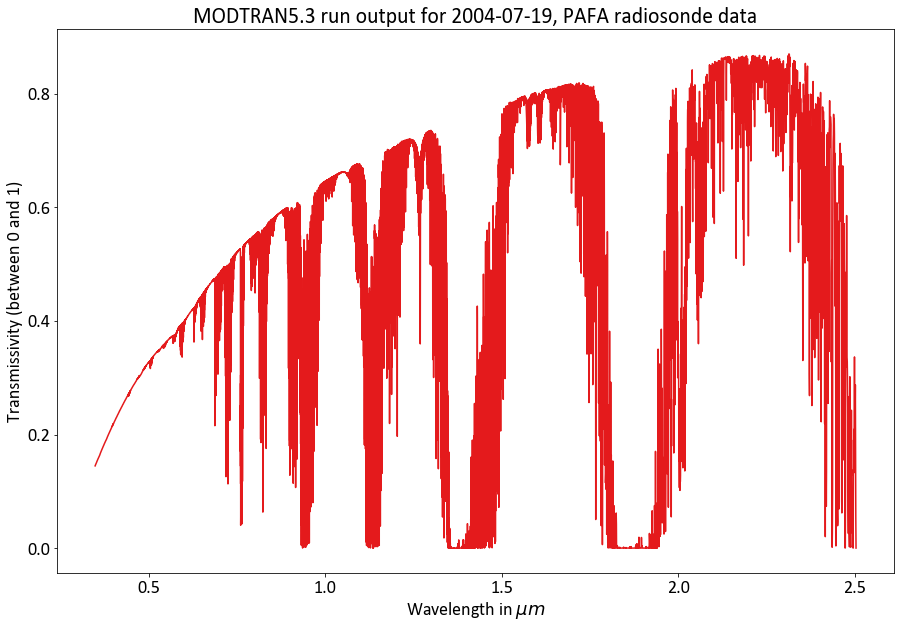

In [20]:
f, ax = plt.subplots(figsize=(15, 10))
ax.plot(wav_mod[::-1], transmiss[::-1])
ax.set_title("MODTRAN5.3 run output for 2004-07-19, PAFA radiosonde data")
ax.set_xlabel("Wavelength in $\mu m$")
ax.set_ylabel("Transmissivity (between 0 and 1)")
#outfile = os.path.join(outdir, "MODTRANout_01.png") 
#plt.savefig(outfile, bbox_inches='tight', dpi=150)

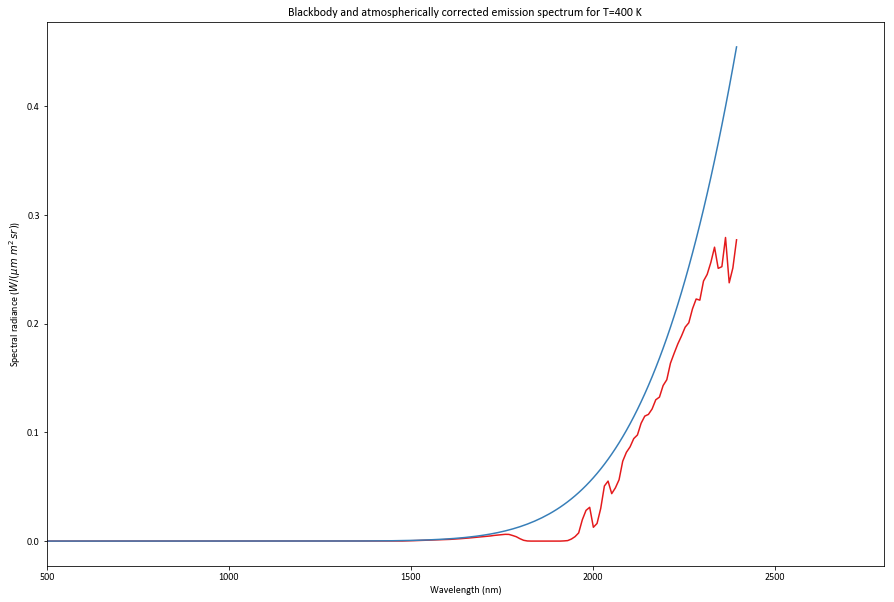

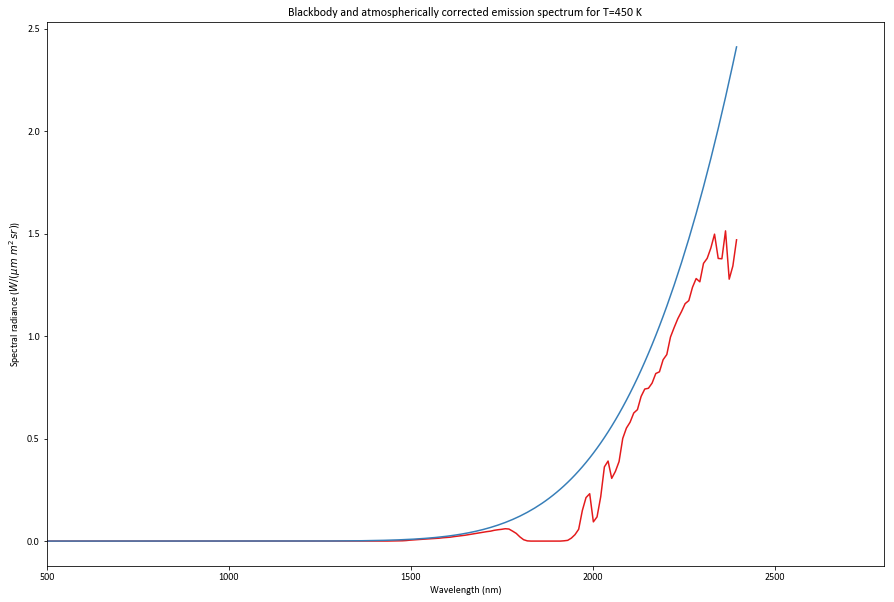

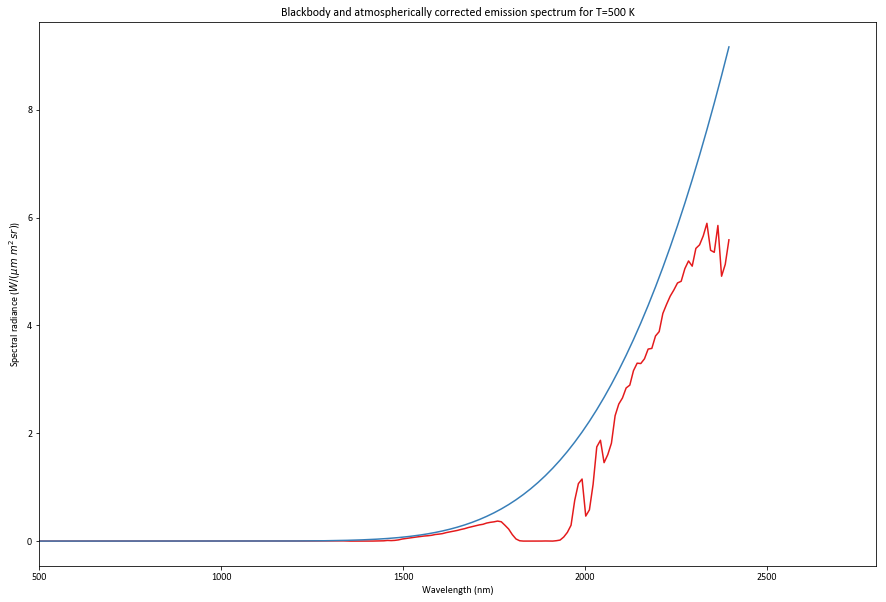

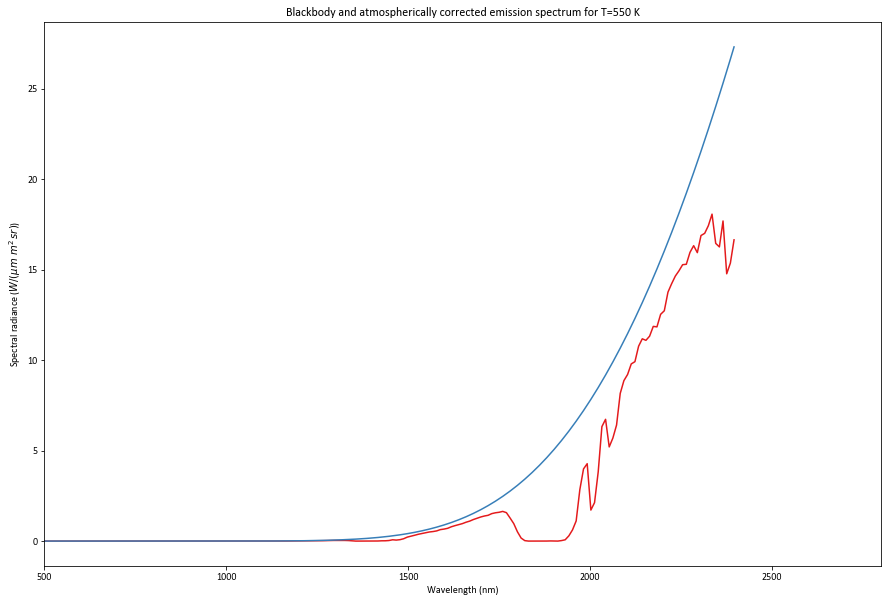

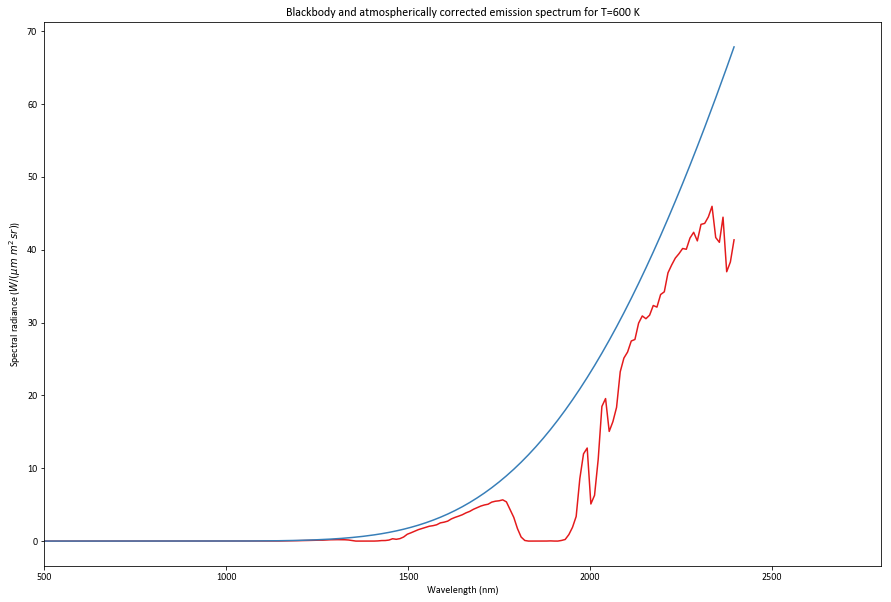

...

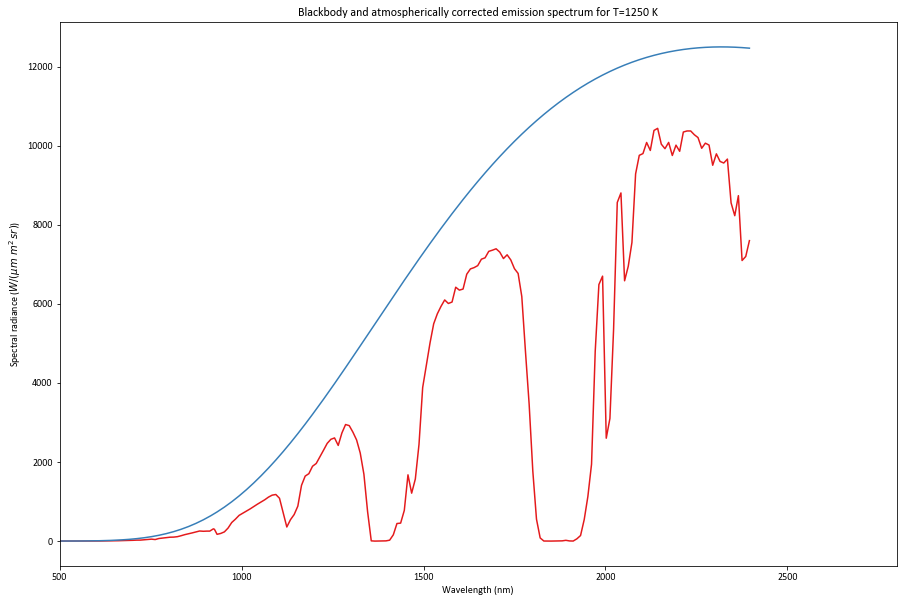

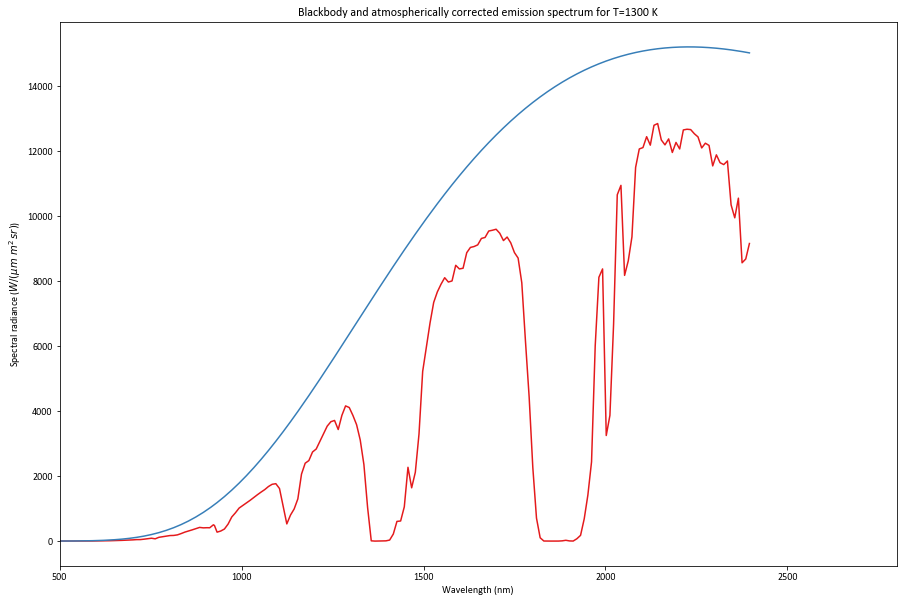

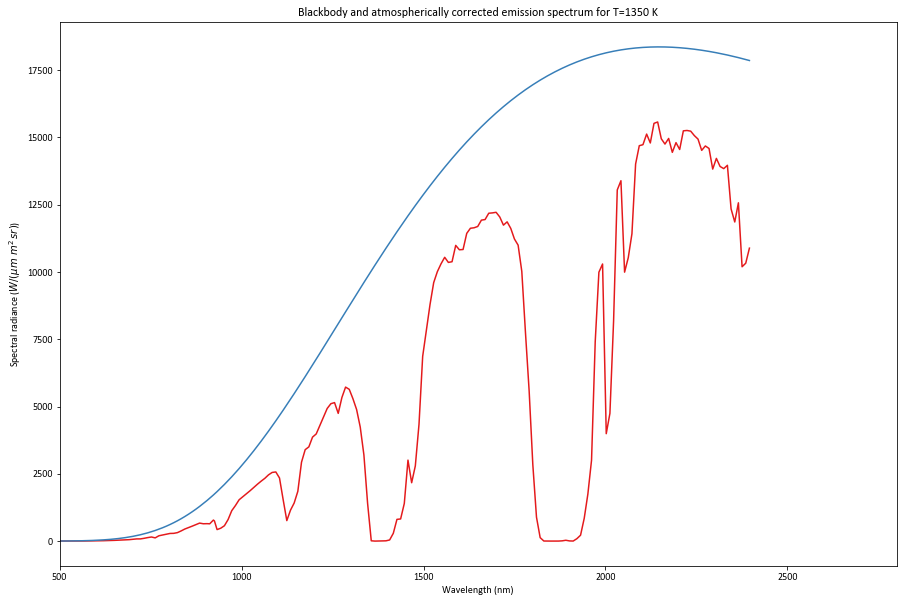

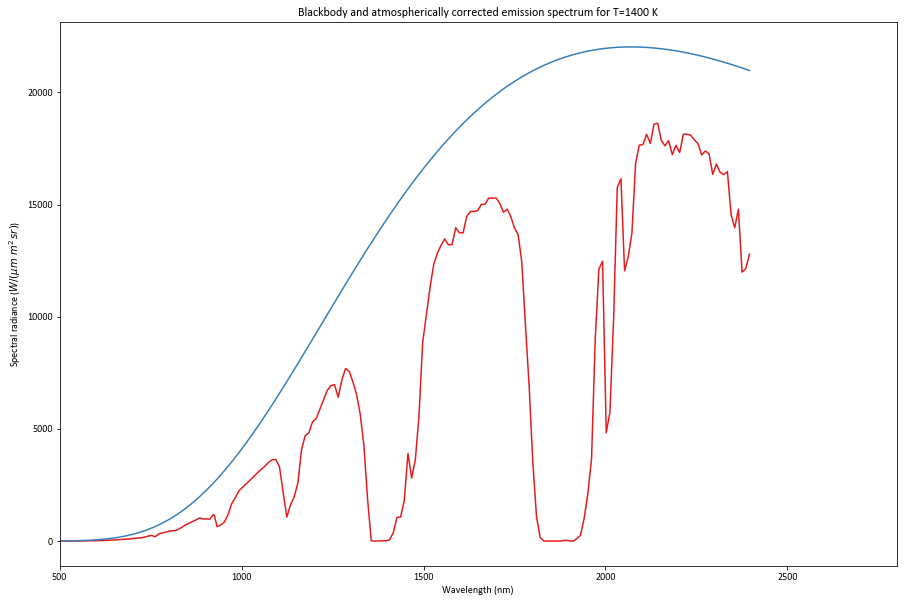

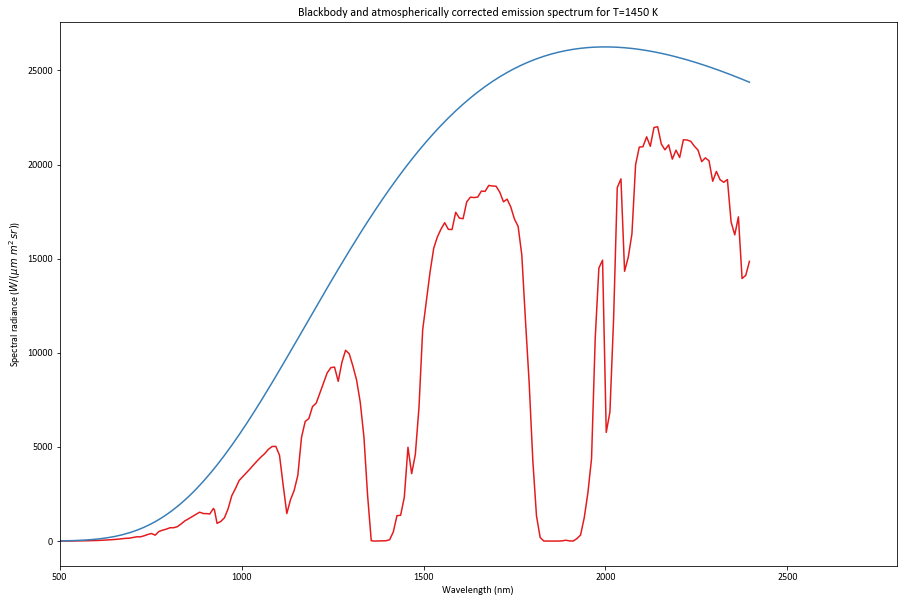

In [20]:
T = 700 # fire temperature, K
for T in np.arange(400, 1500, 50):
    hypdata = hyp.gethyperionbands()
    hypdata = hypdata[np.logical_not(hypdata.Not_Calibrated_X == 'X')]
    lambdabands_hyp = hypdata.Average_Wavelength_nm
    fwhms_hyp = hypdata.Full_Width_at_Half_the_Maximum_FWHM_nm
    lambdas = []
    atmoplancks = []
    for lambdaband, fwhm in zip(lambdabands_hyp, fwhms_hyp):
        inbetween = np.logical_and(wav_mod*1000 > lambdaband - fwhm/2., wav_mod*1000 < lambdaband + fwhm/2.)
        lambdamod = wav_mod[inbetween]
        transmissmod = transmiss[inbetween]
        N = len(lambdamod)
        if not lambdamod.size:
            continue
        dummy = np.sum(ir.specrad(lambdamod, T) * transmissmod)/N
        lambdas.append(lambdaband)
        atmoplancks.append(dummy)

    plancks = np.array([ir.specrad(l/1000, T) for l in lambdas])
    f, ax = plt.subplots(figsize=(15, 10))
    ax.plot(lambdas, atmoplancks)
    ax.plot(lambdas, plancks)
    ax.set_xlim(500, 2800)
    ax.set_xlabel("Wavelength (nm)")
    ax.set_ylabel("Spectral radiance ($W / (\mu m \ m^2\,sr)$)")
    ax.set_title("Blackbody and atmospherically corrected emission spectrum for T=%s K" % T)
    plt.show()

    
        

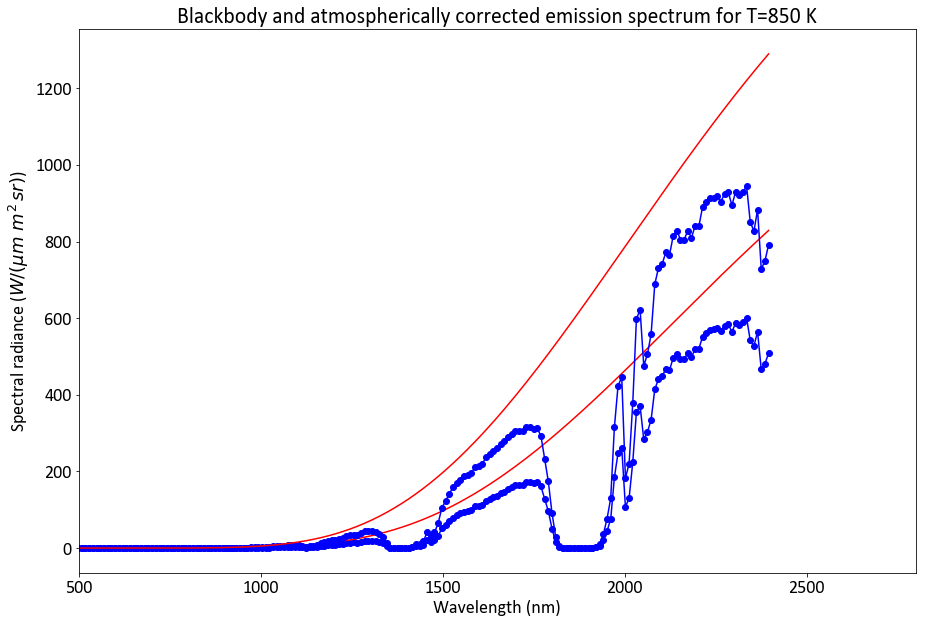

In [13]:
f, ax = plt.subplots(figsize=(15, 10))
ax.set_xlim(500, 2800)
ax.set_xlabel("Wavelength (nm)")
ax.set_ylabel("Spectral radiance ($W / (\mu m \ m^2\,sr)$)")

for T in np.arange(800, 900, 50):
    hypdata = hyp.gethyperionbands()
    hypdata = hypdata[np.logical_not(hypdata.Not_Calibrated_X == 'X')]
    lambdabands_hyp = hypdata.Average_Wavelength_nm
    fwhms_hyp = hypdata.Full_Width_at_Half_the_Maximum_FWHM_nm
    lambdas = []
    atmoplancks = []
    for lambdaband, fwhm in zip(lambdabands_hyp, fwhms_hyp):
        inbetween = np.logical_and(wav_mod*1000 > lambdaband - fwhm/2., wav_mod*1000 < lambdaband + fwhm/2.)
        lambdamod = wav_mod[inbetween]
        transmissmod = transmiss[inbetween]
        N = len(lambdamod)
        if not lambdamod.size:
            continue
        dummy = np.sum(ir.specrad(lambdamod, T) * transmissmod)/N
        lambdas.append(lambdaband)
        atmoplancks.append(dummy)

    plancks = np.array([ir.specrad(l/1000, T) for l in lambdas])
    ax.plot(lambdas, atmoplancks, 'o-', color='blue', label="{}".format(T))
    ax.plot(lambdas, plancks, color='red')
    ax.set_title("Blackbody and atmospherically corrected emission spectrum for T=%s K" % T)

In [13]:
hypdata.dtype.names

('Hyperion_Band',
 'Average_Wavelength_nm',
 'Full_Width_at_Half_the_Maximum_FWHM_nm',
 'Spatial_Resolution_m',
 'Not_Calibrated_X')

## Persisting atmpospherically corrected endmembers

In [5]:
import pandas as pd

In [5]:
hypdata = hyp.gethyperionbands()
hypdata = hypdata[np.logical_not(hypdata.Not_Calibrated_X == 'X')]
lambdabands_hyp = hypdata.Average_Wavelength_nm
fwhms_hyp = hypdata.Full_Width_at_Half_the_Maximum_FWHM_nm

In [6]:
endmembercollection = {}

In [7]:
for firename in ['crazy', 'boundary']:
    modtran = "MODTRAN/{}.tp7".format(firename)
    plotfile = os.path.join(basedir, modtran)
    wavenum, transmiss = np.genfromtxt(plotfile, unpack=True, skip_header=12, usecols=(0, 1), skip_footer=1)
    wav_mod = 1./wavenum * 1.e4
    endmembers = {}
    for T in np.arange(400, 1200, 10):
        atmoplancks = []
        for lambdaband, fwhm in zip(lambdabands_hyp, fwhms_hyp):
            inbetween = np.logical_and(wav_mod*1000 > lambdaband - fwhm/2., wav_mod*1000 < lambdaband + fwhm/2.)
            lambdamod = wav_mod[inbetween]
            transmissmod = transmiss[inbetween]
            N = len(lambdamod)
            if not lambdamod.size:
                continue
            dummy = np.sum(ir.specrad(lambdamod, T) * transmissmod)/N
            atmoplancks.append(dummy)
        endmembers[T] = atmoplancks
    endmembersDF = pd.DataFrame.from_dict(endmembers, orient='index' )
    endmembersDF.sort(inplace=True)
    endmembersDF.columns = lambdabands_hyp
    endmembercollection[firename] = endmembersDF

/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:20: FutureWarning: sort(....) is deprecated, use sort_index(.....)


In [24]:
for firename in ['crazy', 'boundary']:
    endmembercollection[firename].to_csv(
        os.path.join(outdir, "{}.dat".format(firename)), sep='\t')

## T-retrieval

In [4]:
import configs
from pygaarst import raster
import random
from scipy import optimize
import math
import pandas as pd
import seaborn as sns

In [43]:
sns.set_context('paper', font_scale=2.5)
sns.set_style('whitegrid')
font = {'family' : 'Corbel',
        'weight' : 'bold',
        'size'   : 24}
mpl.rc('font', **font)

In [6]:
firename = 'crazy'

In [7]:
random.seed(123)

#### 1 Load endmembers

In [8]:
indir = configs.FIREPARAM[firename]['filedir']
infilename = os.path.join(basedir, indir, "{}_T_endmembers.dat".format(firename))
endmembersDF = pd.DataFrame.from_csv(infilename, sep='\t')

 #### 2 load fireclassification

In [9]:
infilename = os.path.join(basedir, indir, "{}_random_forest_extraction.tif".format(firename))
classification = raster.GeoTIFF(infilename)
firecond = classification.data == 0
fireclass = np.ma.masked_not_equal(classification.data, 0)
backgroundclass = np.ma.masked_outside(classification.data, 1, 2)
scarclass = np.ma.masked_not_equal(classification.data, 1)
veggieclass = np.ma.masked_not_equal(classification.data, 2)

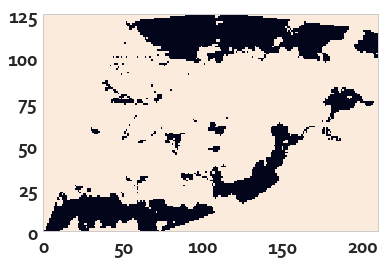

In [10]:
plt.pcolormesh(np.flipud(veggieclass.mask))

In [11]:
fireindices = zip(*np.where(~fireclass.mask))
backgroundindices = zip(*np.where(~backgroundclass.mask))
scarindices = zip(*np.where(~scarclass.mask))
veggieindices = zip(*np.where(~veggieclass.mask))

In [12]:
len(fireindices), len(backgroundindices)

(1019, 12492)

#### 3 Load spectra

In [13]:
infn = os.path.join(basedir, indir, "{}_hullallspecs_calib.hdf5".format(firename))
with h5py.File(infn, "r") as infh:
    spectest = infh['spectrum'][...]
    i_buff = infh['i_row_idx'][...]
    j_buff = infh['j_col_idx'][...]
    wav = infh['bandwavelenght_nm'][...]

buff_indices = zip(i_buff, j_buff)
intersectionidx = [buff_indices.index(pair) for pair in fireindices]
firespecs_SWIR = spectest[intersectionidx, 98:]

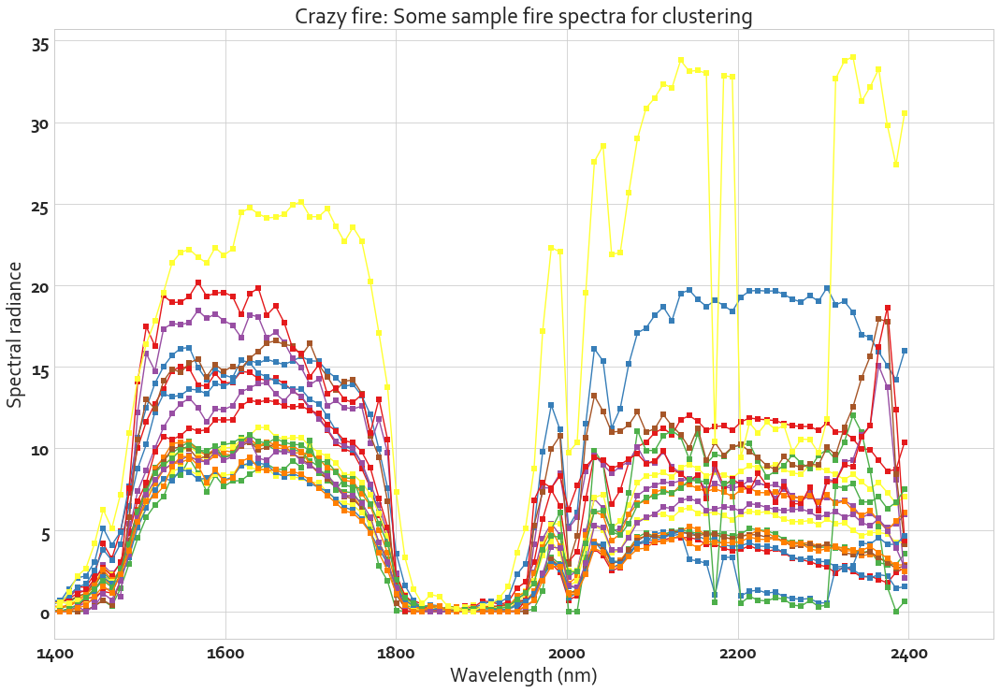

In [14]:
f, ax = plt.subplots(1, 1, figsize=(18, 12))
ax.set_xlabel("Wavelength (nm)")
ax.set_ylabel("Spectral radiance")
ax.set_xlim(1400, 2500)
#ax.set_ylim(0, 10)
ax.set_title("%s fire: Some sample fire spectra for clustering" % (firename.capitalize()))
for spec in firespecs_SWIR[:20, :]:
    ax.plot(wav[98:], spec, 's-')  


### 4 Select backgrund samples for background and average

In [15]:
random.seed(100)

In [16]:
swir_range = wav[98:]

In [17]:
vegsample = random.sample(veggieindices, 100)
intersectionidx = [buff_indices.index(pair) for pair in vegsample]
vegsamplespecs_SWIR = spectest[intersectionidx, 98:]
avg_veg_SWir = np.mean(vegsamplespecs_SWIR, axis=0)

In [18]:
avg_veg_SWir

array([ 0.40462503,  0.44137502,  0.53362501,  0.75537485,  0.85250002,
        1.27050018,  2.01112485,  1.57325017,  2.10525036,  3.45862508,
        5.05812597,  6.16700077,  7.2353735 ,  7.95562792,  8.38812542,
        8.7179985 ,  8.88199997,  8.36250019,  8.26475048,  8.75962448,
        8.53049946,  8.63000202,  9.25500107,  9.4038744 ,  9.00525188,
        8.97612381,  8.87937355,  8.65949917,  8.43812466,  8.151124  ,
        7.7538743 ,  7.2832489 ,  6.70187426,  6.18575001,  5.79037666,
        5.60275078,  5.06300068,  4.1937499 ,  3.1449995 ,  2.18075037,
        0.91525018,  0.33949998,  0.20424999,  0.14299995,  0.11812494,
        0.12099998,  0.14774996,  0.13349995,  0.08787495,  0.09374998,
        0.13837495,  0.13887496,  0.09474995,  0.10974997,  0.18862499,
        0.223125  ,  0.42312503,  0.94187522,  1.37787473,  1.20912504,
        0.43987501,  0.52799994,  1.25550008,  1.89950001,  1.80150008,
        1.31199992,  1.31737471,  1.63774991,  1.92425001,  2.02

In [19]:
scarsample = random.sample(scarindices, 100)
intersectionidx = [buff_indices.index(pair) for pair in scarsample]
scarsamplespecs_SWIR = spectest[intersectionidx, 98:]
avg_scar_SWir = np.mean(scarsamplespecs_SWIR, axis=0)

In [20]:
bgsample = scarsample + vegsample
intersectionidx = [buff_indices.index(pair) for pair in bgsample]
bgsamplespecs_SWIR = spectest[intersectionidx, 98:]
avg_bg_SWir = np.mean(bgsamplespecs_SWIR, axis=0)

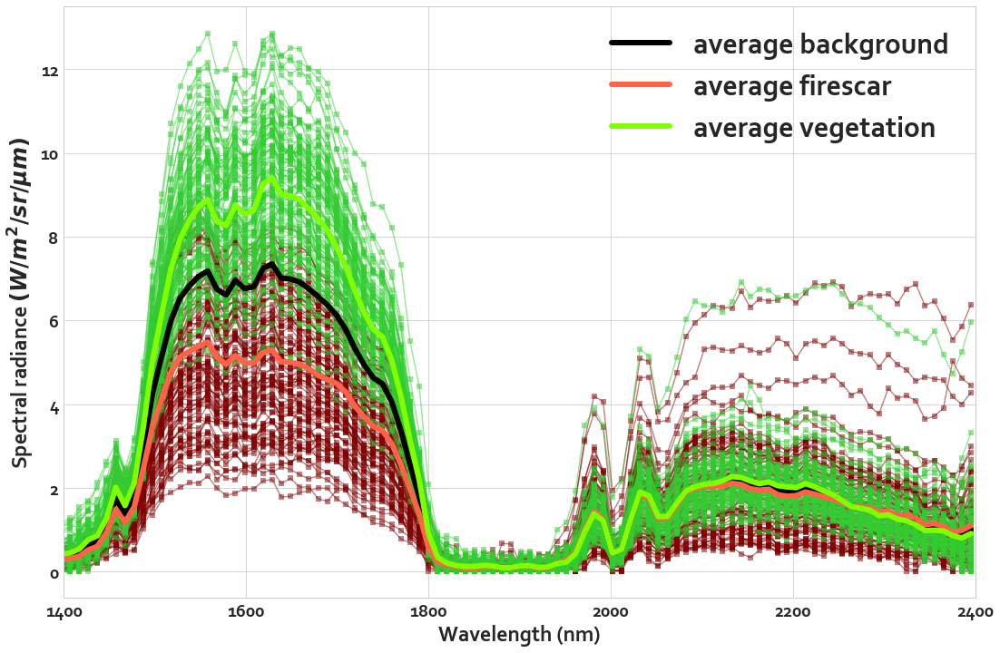

In [21]:
f, ax = plt.subplots(1, 1, figsize=(18, 12))
ax.set_xlabel("Wavelength (nm)", font)
ax.set_ylabel('Spectral radiance $(W / m^2 / sr / \mu m)$', font)
ax.set_xlim(1400, 2400)
#ax.set_ylim(0, 10)
for spec in scarsamplespecs_SWIR[:100, :]:
    ax.plot(swir_range, spec, 's-', color='maroon', alpha=.5)  
for spec in vegsamplespecs_SWIR[:100, :]:
    ax.plot(wav[98:], spec, 's-', color='limegreen', alpha=.5)  
ax.plot(swir_range, avg_bg_SWir, linewidth=6, color='k', label='average background')
ax.plot(swir_range, avg_scar_SWir, linewidth=6, color='tomato', label='average firescar')
ax.plot(swir_range, avg_veg_SWir, linewidth=6, color='chartreuse', label='average vegetation')
plt.legend(loc=1, prop={'size': 32})

#### 5 generate endmembers for SWIR only

In [22]:
SWIRcols = [str(wl) for wl in wav[98:]]
endmembers_SWIR = endmembersDF[SWIRcols]

#### 6 Functions! 

In [23]:
def find_wavelenght_idx(lamb):
    return (np.abs(wav[98:]-lamb)).argmin()

def spec_1T(lambs, T, pf, pveg):
    try:
        idx = [find_wavelenght_idx(lamb) for lamb in lambs]
    except TypeError:
        idx = find_wavelenght_idx(lambs)
    Teff = min(int((100*T) // 10 * 10), 1190)
    Teff = max(Teff, 400)
    return (
        pf * endmembers_SWIR.loc[Teff].values + 
        pveg * avg_veg_SWir + 
        (1 - pf - pveg) * avg_scar_SWir )[idx]
    
def spec_2T(lambs, T1, T2, pf1, pf2, pveg):
    try:
        idx = [find_wavelenght_idx(lamb) for lamb in lambs]
    except TypeError:
        idx = find_wavelenght_idx(lambs)
    T1eff = min(round(100.*T1, -1), 1190)
    T1eff = max(int(T1eff), 400)
    T2eff = min(round(100.*T2, -1), 1190)
    T2eff = max(int(T2eff), 400)
    return (
        pf1 * endmembers_SWIR.loc[T1eff].values + 
        pf2 * endmembers_SWIR.loc[T2eff].values + 
        pveg * avg_veg_SWir + 
        (1 - pf1 - pf2 - pveg) * avg_scar_SWir )[idx]

def errfunc_1T(param, lambs, spec):
    try:
        idx = [find_wavelenght_idx(lamb) for lamb in lambs]
    except TypeError:
        idx = find_wavelenght_idx(lambs)
    return spec_1T(lambs, *param) - spec[idx]

def errfunc_2T(param, lambs, spec):
    try:
        idx = [find_wavelenght_idx(lamb) for lamb in lambs]
    except TypeError:
        idx = find_wavelenght_idx(lambs)
    return spec_2T(lambs, *param) - spec[idx]


In [28]:
specdraw = firespecs_SWIR[12, :]

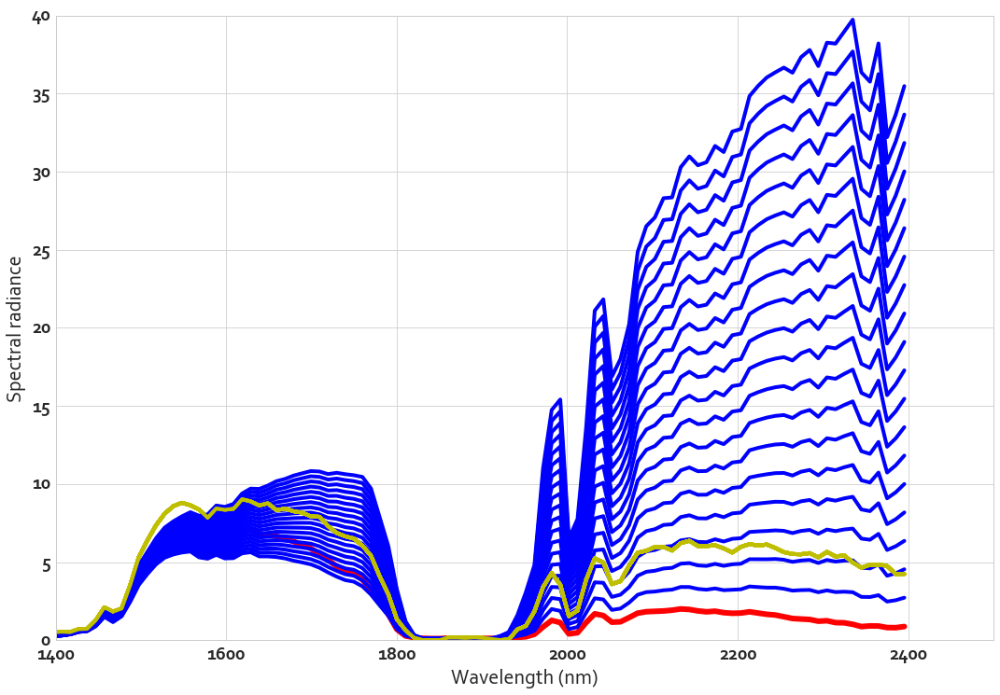

In [235]:
f, ax = plt.subplots(1, 1, figsize=(18, 12))
ax.set_xlabel("Wavelength (nm)")
ax.set_ylabel("Spectral radiance")
ax.set_xlim(1400, 2500)
#ax.set_ylim(0, 10)
 
ax.plot(wav[98:], avg_bg_SWir, linewidth=6, color='r')
for p in np.arange(0.01, 0.2, 0.01):
    spec = [spec_1T(lamb, 7, p, 0.1 ) for lamb in wav[98:]]
    ax.plot(swir_range, spec, linewidth=4, color='b')
    ax.plot(swir_range, specdraw, linewidth=4, color='y')

    

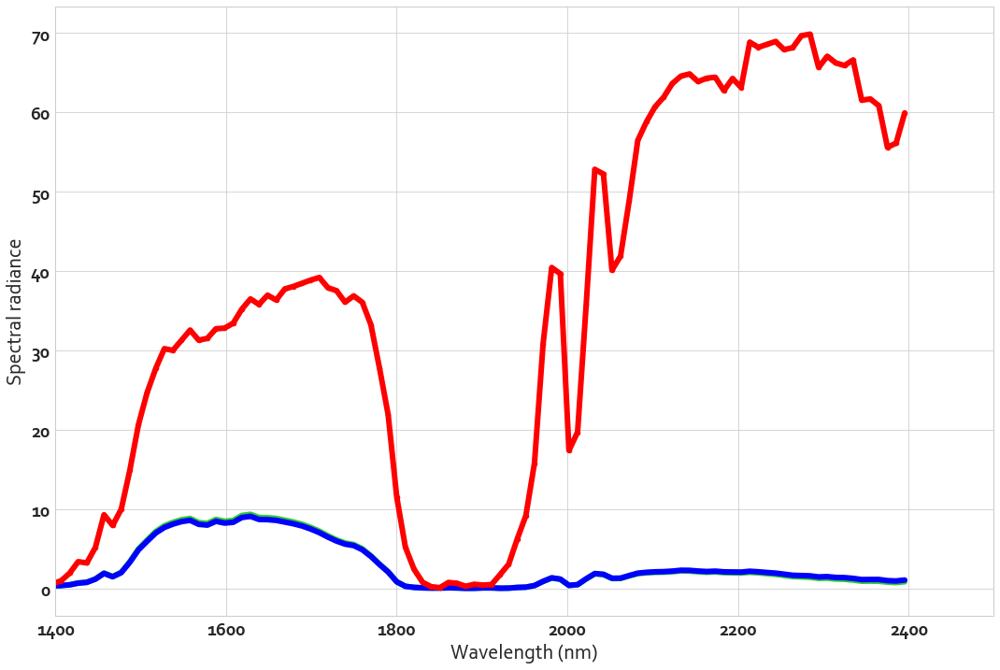

In [24]:
f, ax = plt.subplots(1, 1, figsize=(18, 12))
ax.set_xlabel("Wavelength (nm)")
ax.set_ylabel("Spectral radiance")
ax.set_xlim(1400, 2500)
#ax.set_ylim(0, 10)
 
ax.plot(swir_range, avg_veg_SWir, linewidth=6, color='limegreen')
ax.plot(swir_range, spec_2T(swir_range, 8, 5.3, 0.0, .02, .96), linewidth=6, color='b')
ax.plot(swir_range, firespecs_SWIR[132, :], 'o-', color='red', linewidth=6)
    

In [237]:
popt, pcov = optimize.curve_fit(spec_2T, swir_range, specdraw, method='dogbox',
            bounds=([4., 4., 0., 0., 0.], [12., 12., 1., 1., 1.,])     )

In [238]:
popt

array([ 8.        ,  8.        ,  0.00805002,  0.        ,  0.5       ])

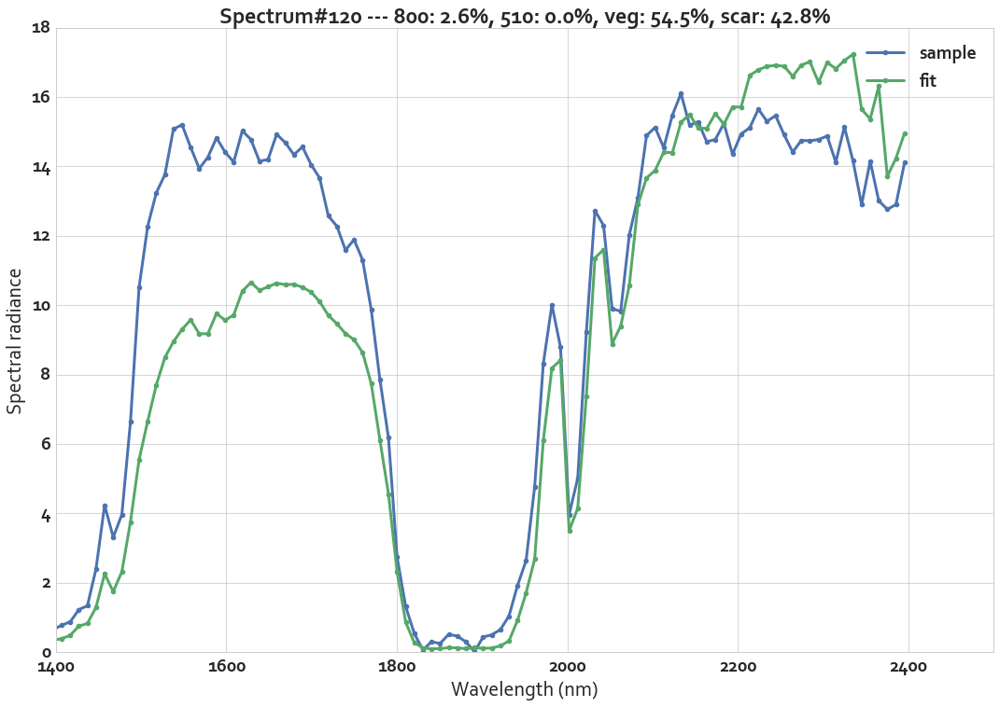

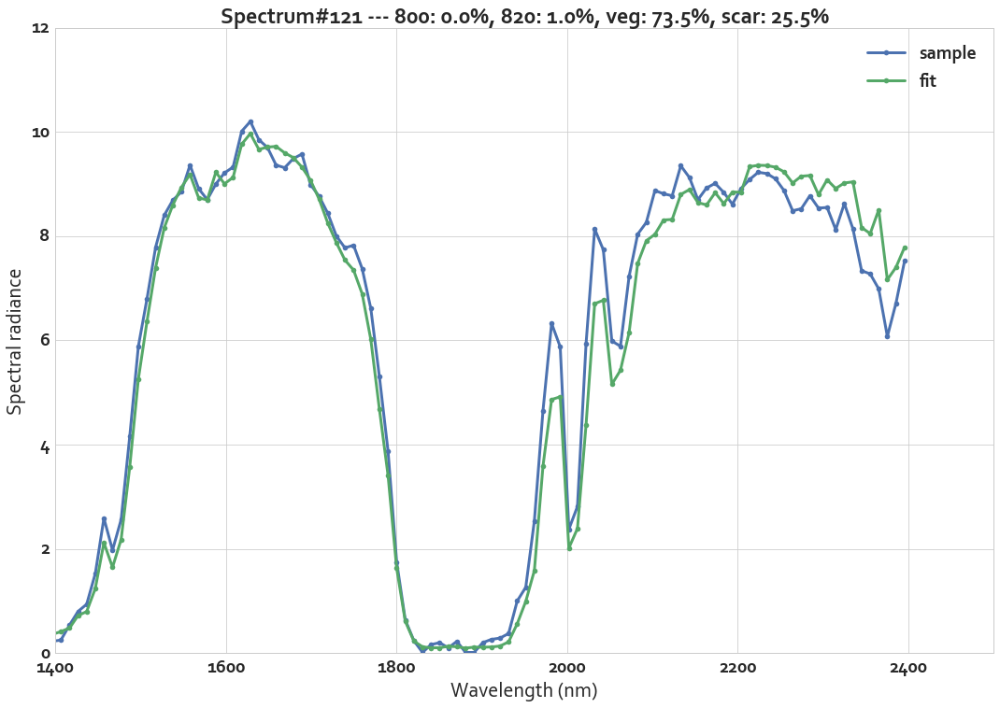

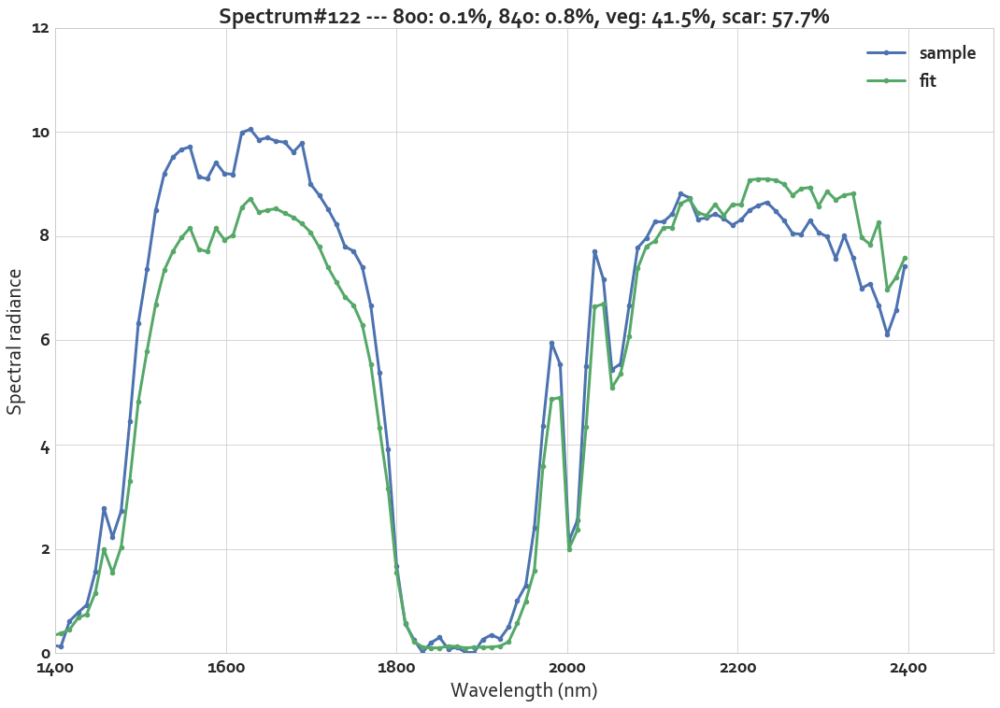

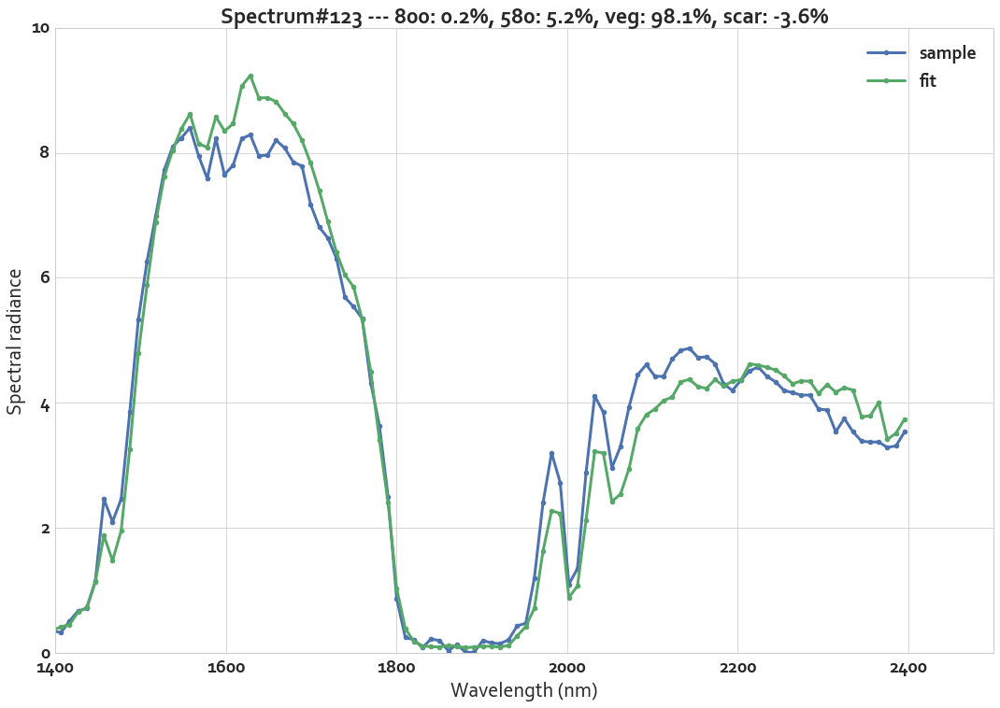

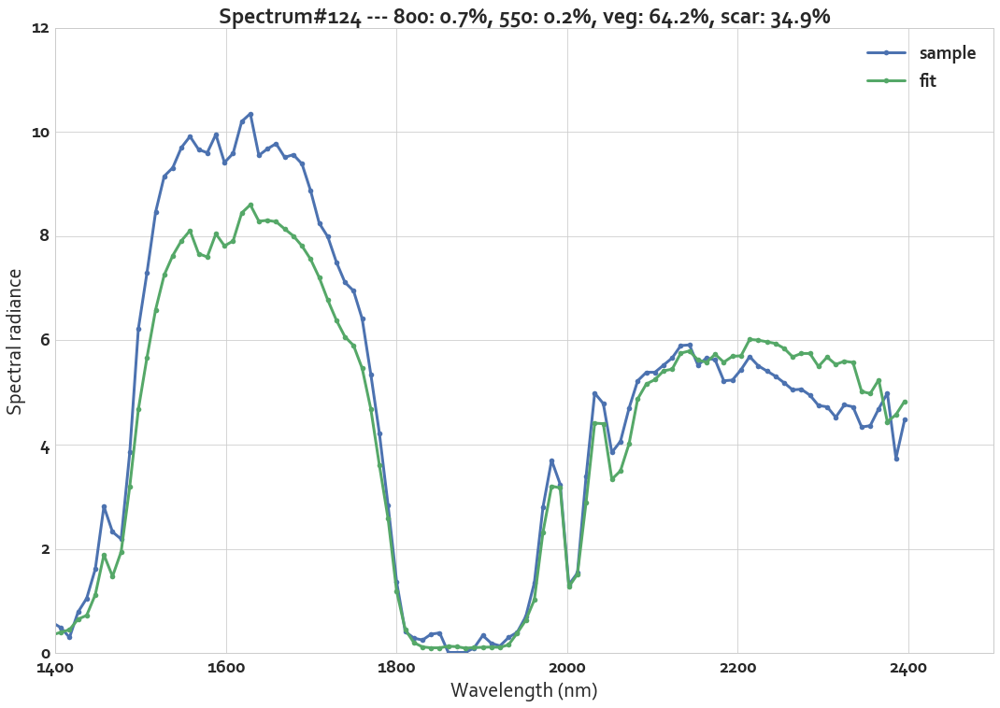

...

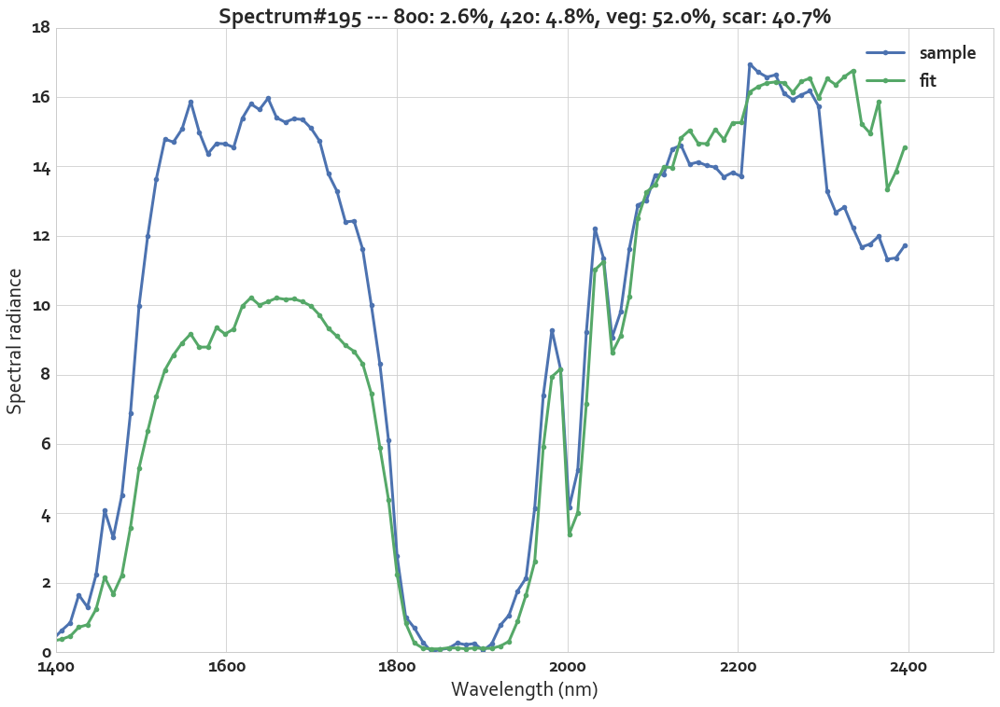

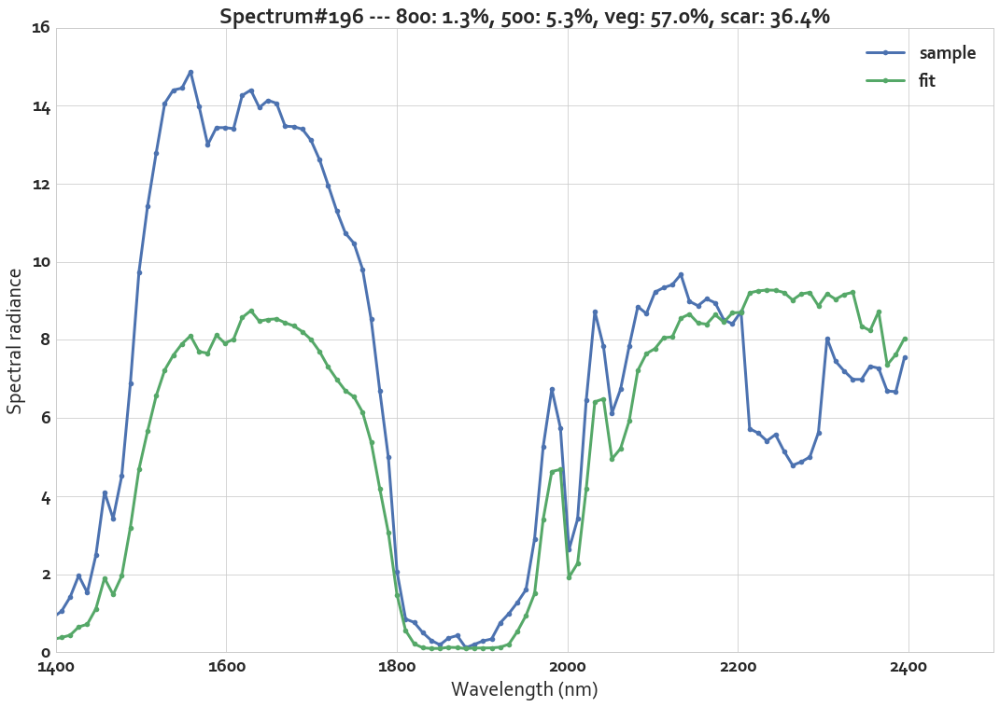

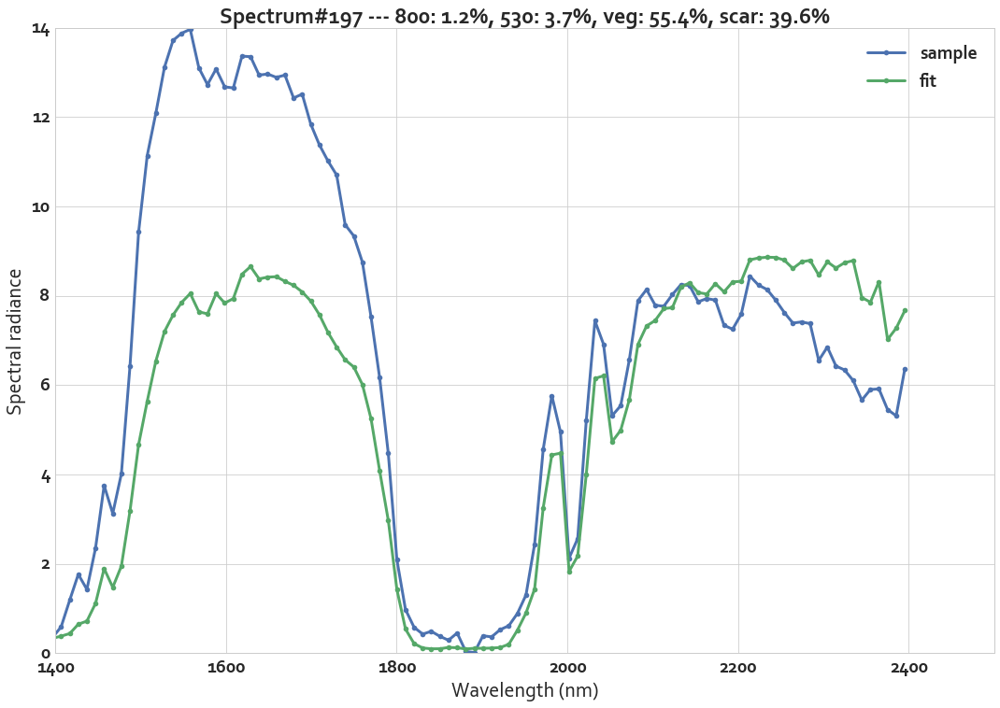

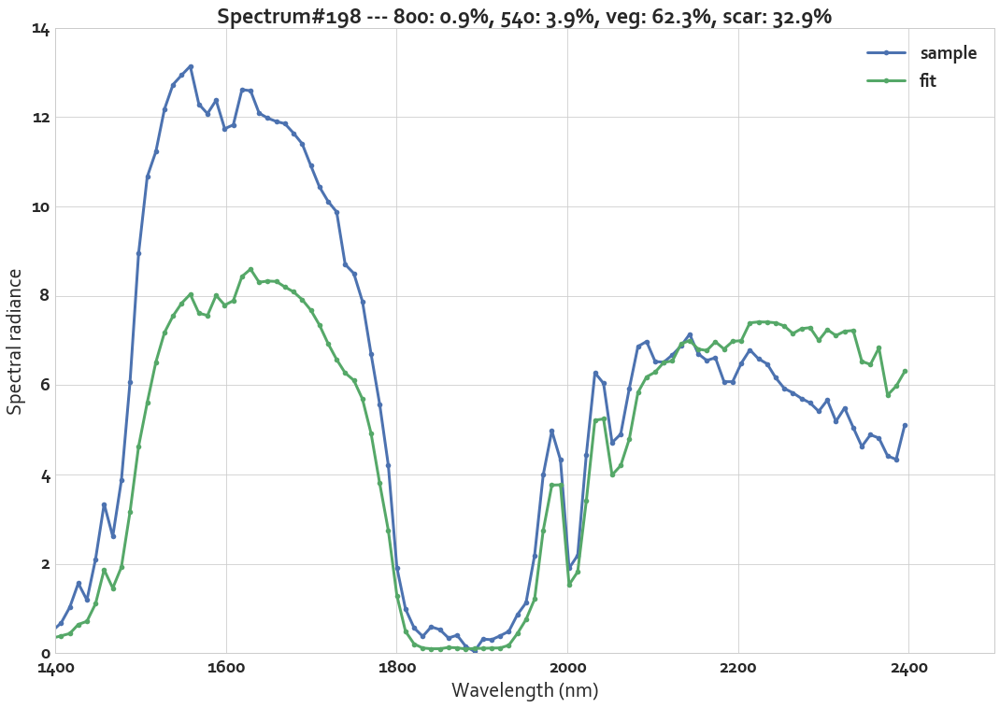

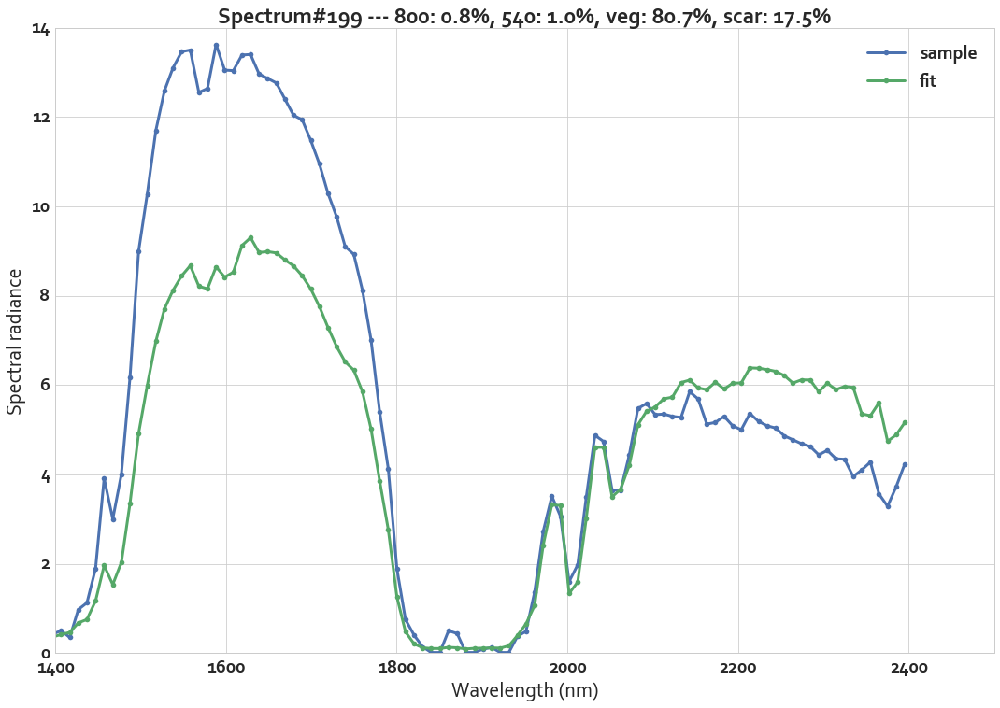

In [239]:
for idx, specdraw in enumerate(firespecs_SWIR[120:200, :]):
    ii = idx + 120
    popt, pcov = optimize.curve_fit(spec_2T, swir_range, specdraw, 
                bounds=([4., 4., 0., 0., 0.], [12., 12., 1., 1., 1.,])     )
    f, ax = plt.subplots(1, 1, figsize=(18, 12))
    ax.set_xlabel("Wavelength (nm)")
    ax.set_ylabel("Spectral radiance")
    ax.set_xlim(1400, 2500)
    ax.set_title("Spectrum#{} --- {:3.0f}: {:3.1f}%, {:3.0f}: {:3.1f}%, veg: {:3.1f}%, scar: {:3.1f}%".format(
        ii, int(popt[0]*100)//10*10, popt[2]*100, int(popt[1]*100)//10*10, popt[3]*100, popt[4]*100, (1-popt[2]-popt[3]-popt[4])*100))
    plt.plot(wav[98:], specdraw, 'o-', linewidth=3, label='sample')
    plt.plot(swir_range, spec_2T(swir_range, *popt), 'o-', linewidth=3, label='fit')

    plt.legend()
    plt.show()
    plt.close(f)

In [29]:
results = {}

for idx, specdraw in enumerate(firespecs_SWIR):
    results[idx] = {}
    results[idx]['ii'] = fireindices[idx][0]
    results[idx]['jj'] = fireindices[idx][1]
    popt, pcov = optimize.curve_fit(spec_2T, swir_range, specdraw, 
                bounds=([4., 4., 0., 0., 0.], [12., 12., 1., 1., 1.,]) )
    if popt[2] > popt[3]:
        results[idx]['T1'] = popt[0]*100
        results[idx]['p1'] = popt[2]
        results[idx]['T2'] = popt[1]*100
        results[idx]['p2'] = popt[3]
        results[idx]['delT1'] = math.sqrt(pcov[0][0])*100
        results[idx]['delp1'] = math.sqrt(pcov[2][2])
        results[idx]['delT2'] = math.sqrt(pcov[1][1])*100
        results[idx]['delp2'] = math.sqrt(pcov[3][3])
    else:
        results[idx]['T1'] = popt[1]*100
        results[idx]['p1'] = popt[3]
        results[idx]['T2'] = popt[0]*100
        results[idx]['p2'] = popt[2]
        results[idx]['delT1'] = math.sqrt(pcov[1][1])*100
        results[idx]['delp1'] = math.sqrt(pcov[3][3])
        results[idx]['delT2'] = math.sqrt(pcov[0][0])*100
        results[idx]['delp2'] = math.sqrt(pcov[2][2])
    results[idx]['pveg'] = popt[4]   
    results[idx]['delpveg'] = math.sqrt(pcov[3][3])

KeyboardInterrupt: 

In [25]:
t_retrieval = pd.DataFrame.from_dict(results, orient='index')

NameError: name 'results' is not defined

In [177]:
t_retrieval['pscar'] = 1 - t_retrieval['p1'] - t_retrieval['p2'] - t_retrieval['pveg']

In [178]:
t_retrieval['pbg'] = t_retrieval['pveg'] + t_retrieval['pscar']
t_retrieval['pf'] = t_retrieval['p1'] + t_retrieval['p2']

In [179]:
t_retrieval.to_csv(os.path.join(outdir, "{}_T_retrieval.dat".format(firename)), sep='\t')

In [71]:
t_retrieval.loc[197]

p2         1.627894e-16
p1         1.231838e-02
delT2      1.977638e-15
pveg       4.741942e-01
delT1      0.000000e+00
delp2      8.627615e-02
delp1      4.017398e-03
T2         5.834905e+02
T1         8.000000e+02
ii         2.900000e+01
jj         1.270000e+02
delpveg    8.627615e-02
pscar      5.134875e-01
pbg        9.876816e-01
pf         1.231838e-02
Name: 197, dtype: float64

In [72]:
t_retrieval

,p2,p1,delT2,pveg,delT1,delp2,delp1,T2,T1,ii,jj,delpveg,pscar,pbg,pf
0,8.465172e-04,0.002791,0.000000e+00,0.665320,2.833835e-15,0.028377,0.016412,800.000000,855.096066,4,53,0.016412,0.331043,0.996363,0.003637
1,1.870361e-06,0.006227,7.840117e-16,0.322354,0.000000e+00,0.070528,0.029451,718.335728,800.000000,4,154,0.070528,0.671417,0.993771,0.006229
2,5.685377e-03,0.034153,0.000000e+00,0.836405,1.254170e-13,0.000910,0.807657,800.000000,426.739804,12,62,0.807657,0.123756,0.960162,0.039838
3,1.067486e-02,0.023656,0.000000e+00,0.756193,5.290601e-15,0.004525,0.076256,800.000000,590.704249,13,65,0.076256,0.209477,0.965669,0.034331
4,5.654078e-03,0.019837,0.000000e+00,0.871051,1.384824e-14,0.000779,1.377967,800.000000,406.817428,18,72,1.377967,0.103457,0.974509,0.025491
5,8.492570e-03,0.013096,7.806794e-15,0.726194,0.000000e+00,0.199882,0.001051,479.227227,800.000000,18,99,0.199882,0.252218,0.978412,0.021588
6,3.284232e-05,0.002075,0.000000e+00,0.951169,9.233321e-15,0.002612,0.001100,800.000000,899.483948,19,72,0.001100,0.046722,0.997892,0.002108
7,1.232059e-04,0.018151,1.957911e-15,0.984397,0.000000e+00,0.019059,0.005463,692.264763,800.000000,19,98,0.019059,-0.002671,0.981726,0.018274
8,5.851892e-03,0.032287,5.701751e-15,0.963818,0.000000e+00,0.086418,0.004390,580.738716,800.000000,19,99,0.086418,-0.001957,0.961861,0.038139
9,1.406841e-02,0.212163,0.000000e+00,0.864637,1.058116e-12,0.001892,4.903855,800.000000,401.477764,19,117,4.903855,-0.090869,0.773768,0.226232


In [73]:
colorraster = np.zeros(classification.data.shape)
arearaster = np.zeros(classification.data.shape)

In [74]:
for idx, row in t_retrieval.iterrows():
    print(row['ii'], row['jj'], row['T1'])
    ii = int(row['ii'])
    jj = int(row['jj'])
    colorraster[ii, jj] = row['T1']
    arearaster[ii, jj] = row['pf']*100

(4.0, 53.0, 855.09606570458129)
(4.0, 154.0, 800.0)
(12.0, 62.0, 426.73980365659662)
(13.0, 65.0, 590.70424858176716)
(18.0, 72.0, 406.81742812885045)
(18.0, 99.0, 800.0)
(19.0, 72.0, 899.48394786535641)
(19.0, 98.0, 800.0)
(19.0, 99.0, 800.0)
(19.0, 117.0, 401.47776379046769)
(19.0, 118.0, 927.05490304391299)
(20.0, 98.0, 800.0)
(20.0, 99.0, 800.0)
(20.0, 117.0, 542.98635929772013)
(20.0, 118.0, 800.0)
(21.0, 123.0, 530.45039973585176)
(21.0, 124.0, 800.0)
(22.0, 120.0, 800.0)
(22.0, 121.0, 604.81162918700602)
(22.0, 122.0, 800.0)
(22.0, 123.0, 800.0)
(22.0, 124.0, 547.52464932133512)
(22.0, 125.0, 561.36593988375716)
(22.0, 126.0, 405.65939183432033)
(22.0, 127.0, 800.0)
(22.0, 128.0, 800.0)
(22.0, 129.0, 800.0)
(22.0, 130.0, 449.68709094353318)
(22.0, 203.0, 505.50298822040327)
(22.0, 204.0, 800.0)
(22.0, 205.0, 800.0)
(22.0, 206.0, 869.8428443977599)
(23.0, 44.0, 493.52502634027979)
(23.0, 114.0, 418.36646749830652)
(23.0, 116.0, 630.99466293880255)
(23.0, 117.0, 800.0)
(23.0, 118.

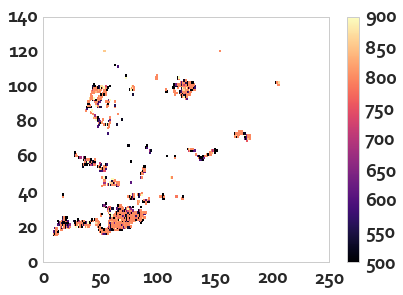

In [76]:
colorplot = np.ma.masked_array(colorraster, mask= fireclass.mask)
colorplt = plt.pcolormesh(np.flipud(colorplot), cmap='magma', vmin=500, vmax=900)
plt.colorbar(colorplt)

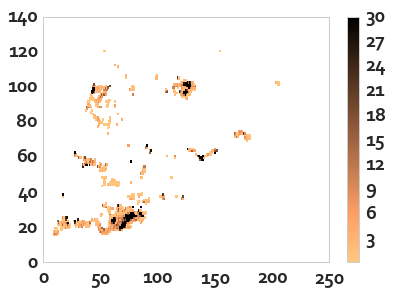

In [77]:
areaplot = np.ma.masked_array(arearaster, mask= fireclass.mask)
areaplt = plt.pcolormesh(np.flipud(areaplot), cmap='copper_r', vmax=30)
plt.colorbar(areaplt)

In [83]:
cmap = sns.dark_palette("lightgrey", as_cmap=True, reverse=True)


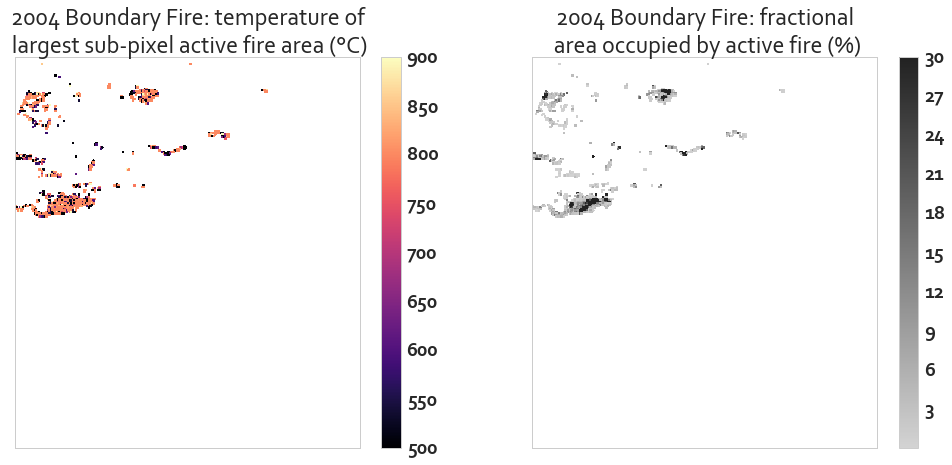

In [84]:
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True,figsize=(17, 7))
for ax in [ax1, ax2]:
    ax.set_aspect('equal')
    ax.grid(None)
    ax.axhline(linewidth=2, color="darkgrey") 
    ax.axvline(linewidth=2, color="darkgrey") 
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_ylim([266, 0])
    ax.set_xlim([0, 305])
ax1.set_title(u"2004 Boundary Fire: temperature of\n largest sub-pixel active fire area (°C)")
ax2.set_title(u"2004 Boundary Fire: fractional\n area occupied by active fire (%)")
colorplt = ax1.pcolormesh(colorplot, cmap='magma', vmin=500, vmax=900)
plt.colorbar(colorplt, ax=ax1)

#areaplt = ax2.pcolormesh(areaplot, cmap='copper_r', vmax=30)
areaplt = ax2.pcolormesh(areaplot, cmap=cmap, vmax=30)
plt.colorbar(areaplt, ax=ax2)


#### Complete fire plot

In [26]:
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes


In [27]:
firenamec = 'crazy'
indirc = configs.FIREPARAM[firenamec]['filedir']
firenameb = 'boundary'
indirb = configs.FIREPARAM[firenameb]['filedir']

In [28]:
t_retrievalb = pd.DataFrame.from_csv(os.path.join(basedir, indirb, "{}_T_retrieval.dat".format(firenameb)), sep='\t')
t_retrievalc = pd.DataFrame.from_csv(os.path.join(basedir, indirc, "{}_T_retrieval.dat".format(firenamec)), sep='\t')

In [29]:
infilename = os.path.join(basedir, indirb, "{}_random_forest_extraction.tif".format(firenameb))
classificationb = raster.GeoTIFF(infilename)
firecond = classificationb.data == 0
fireclassb = np.ma.masked_not_equal(classificationb.data, 0)

In [30]:
infilename = os.path.join(basedir, indirc, "{}_random_forest_extraction.tif".format(firenamec))
classificationc = raster.GeoTIFF(infilename)
firecond = classificationc.data == 0
fireclassc = np.ma.masked_not_equal(classificationc.data, 0)

In [31]:
colorrasterb = np.zeros(classificationb.data.shape)
arearasterb = np.zeros(classificationb.data.shape)
colorrasterc = np.zeros(classificationc.data.shape)
arearasterc = np.zeros(classificationc.data.shape)

In [32]:
for idx, row in t_retrievalb.iterrows():
    ii = int(row['ii'])
    jj = int(row['jj'])
    colorrasterb[ii, jj] = row['T1']
    arearasterb[ii, jj] = row['pf']*100
for idx, row in t_retrievalc.iterrows():
    ii = int(row['ii'])
    jj = int(row['jj'])
    colorrasterc[ii, jj] = row['T1']
    arearasterc[ii, jj] = row['pf']*100

In [33]:
areaplotb = np.ma.masked_array(arearasterb, mask=fireclassb.mask)
colorplotb = np.ma.masked_array(colorrasterb, mask=fireclassb.mask)
areaplotc = np.ma.masked_array(arearasterc, mask=fireclassc.mask)
colorplotc = np.ma.masked_array(colorrasterc, mask=fireclassc.mask)


In [34]:
cmap = sns.dark_palette("light grey", as_cmap=True, reverse=True, input="xkcd")

In [35]:

sns.set_context('paper', font_scale=2.5)
sns.set_style('white', {"axes.facecolor": "1", "axes.grid": False})
font = {'family' : 'Corbel',
        'weight' : 'bold',
        'size'   : 24}

mpl.rc('font', **font)

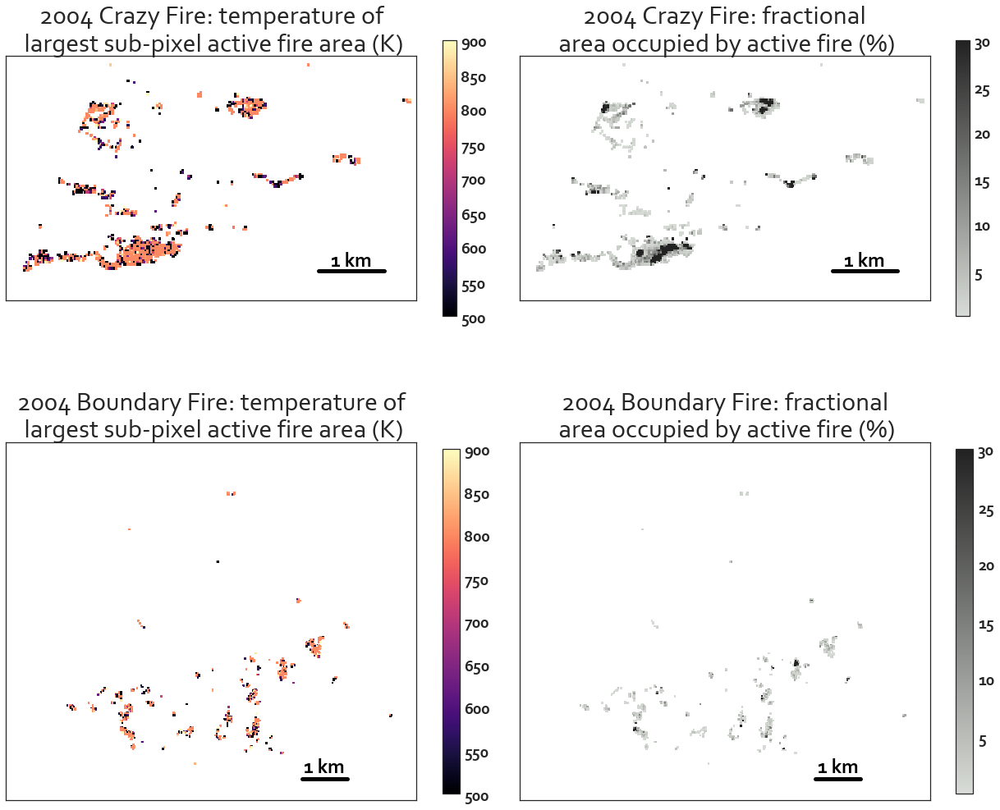

In [44]:
fig = plt.figure(figsize=(18, 15))
gs = gridspec.GridSpec(2, 2,
                       width_ratios=[1, 1],
                       height_ratios=[20, 25],
                       hspace=0)
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])
ax4 = plt.subplot(gs[3])
for ax in [ax1, ax2, ax3, ax4]:
    ax.set_aspect('equal')
    ax.grid(False)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
for ax in [ax3, ax4]:
    ax.set_ylim([266, 0])
    ax.set_xlim([0, 305])
for ax in [ax1, ax2]:
    ax.set_ylim([125, 0])
    ax.set_xlim([0, 210])

ax1.set_title(u"2004 Crazy Fire: temperature of\n largest sub-pixel active fire area (K)", fontsize=32)
ax2.set_title(u"2004 Crazy Fire: fractional\n area occupied by active fire (%)", fontsize=32)
ax3.set_title(u"2004 Boundary Fire: temperature of\n largest sub-pixel active fire area (K)", fontsize=32)
ax4.set_title(u"2004 Boundary Fire: fractional\n area occupied by active fire (%)", fontsize=32)
colorpltc = ax1.pcolormesh(colorplotc, cmap='magma', vmin=500, vmax=900)
plt.colorbar(colorpltc, ax=ax1, shrink=0.7)
areapltc = ax2.pcolormesh(areaplotc, cmap=cmap, vmax=30)
plt.colorbar(areapltc, ax=ax2, shrink=0.7)
colorpltb = ax3.pcolormesh(colorplotb, cmap='magma', vmin=500, vmax=900)
plt.colorbar(colorpltb, ax=ax3, shrink=0.7)
areapltb = ax4.pcolormesh(areaplotb, cmap=cmap, vmax=30)
plt.colorbar(areapltb, ax=ax4, shrink=0.7)

# zoomed insets
#axins3 = zoomed_inset_axes(ax3, 2.5, loc=5)
#axins3.pcolormesh(colorplotb, cmap='magma', vmin=500, vmax=900)
#axins3.set_xlim(100, 120) # apply the x-limits
#axins3.set_ylim(240, 260) # apply the y-limits
#axins3.set_xticklabels([])
#axins3.set_yticklabels([])



# scale bars
ax1.plot([160, 193.33], [110, 110], color='k', lw=5)
ax1.text(176.5, 105, 
         '1 km', 
          ha="center", va="center", 
          color='k')
ax2.plot([160, 193.33], [110, 110], color='k', lw=5)
ax2.text(176.5, 105, 
         '1 km', 
          ha="center", va="center", 
          color='black')
ax3.plot([220, 253.33], [250, 250], color='k', lw=5)
ax3.text(236.5, 242, 
         '1 km', 
          ha="center", va="center", 
          color='k')
ax4.plot([220, 253.33], [250, 250], color='k', lw=5)
ax4.text(236.5, 242, 
         '1 km', 
          ha="center", va="center", 
          color='black')

plt.tight_layout(pad=0, h_pad=0, w_pad=0)
fig.tight_layout(pad=0, h_pad=0, w_pad=0)
fig.subplots_adjust(left=.025, right=.99, wspace=0, hspace=0)

In [45]:
outfn = 'Fig09_LR.jpg'
fig.savefig(os.path.join(outdir, outfn), dpi=150, bb_inches='tight')

In [46]:
outfn = 'Fig09.jpg'
fig.savefig(os.path.join(outdir, outfn), dpi=300, bb_inches='tight')

##### Spectral plots

In [36]:
fireindicesc = zip(*np.where(~fireclassc.mask))
fireindicesb = zip(*np.where(~fireclassb.mask))

In [37]:
firenamec = 'crazy'
indirc = configs.FIREPARAM[firenamec]['filedir']
infn = os.path.join(basedir, indirc, "{}_hullallspecs_calib.hdf5".format('crazy'))
with h5py.File(infn, "r") as infh:
    spectestc = infh['spectrum'][...]
    i_buff = infh['i_row_idx'][...]
    j_buff = infh['j_col_idx'][...]
    wav = infh['bandwavelenght_nm'][...]

buff_indicesc = zip(i_buff, j_buff)
intersectionidxc = [buff_indicesc.index(pair) for pair in fireindicesc]
firespecs_SWIRc = spectestc[intersectionidxc, 98:]
infilename = os.path.join(basedir, indirc, "{}_T_endmembers.dat".format(firenamec))
endmembersDFc = pd.DataFrame.from_csv(infilename, sep='\t')

firenameb = 'boundary'
indirb = configs.FIREPARAM[firenameb]['filedir']
infn = os.path.join(basedir, indirb, "{}_hullallspecs_calib.hdf5".format('boundary'))
with h5py.File(infn, "r") as infh:
    spectestb = infh['spectrum'][...]
    i_buff = infh['i_row_idx'][...]
    j_buff = infh['j_col_idx'][...]
    wav = infh['bandwavelenght_nm'][...]

buff_indicesb = zip(i_buff, j_buff)
intersectionidxb = [buff_indicesb.index(pair) for pair in fireindicesb]
firespecs_SWIRb = spectestb[intersectionidxb, 98:]
infilename = os.path.join(basedir, indirb, "{}_T_endmembers.dat".format(firenameb))
endmembersDFb = pd.DataFrame.from_csv(infilename, sep='\t')

In [38]:
swir_range = wav[98:]
SWIRcols = [str(wl) for wl in swir_range]
endmembers_SWIRc = endmembersDFc[SWIRcols]
endmembers_SWIRb = endmembersDFb[SWIRcols]

In [39]:
def find_wavelenght_idx(lamb):
    return (np.abs(wav[98:]-lamb)).argmin()

def spec_1T(lambs, T, pf, pveg, 
            endmembers=endmembers_SWIRb):
    try:
        idx = [find_wavelenght_idx(lamb) for lamb in lambs]
    except TypeError:
        idx = find_wavelenght_idx(lambs)
    Teff = min(int((100*T) // 10 * 10), 1190)
    Teff = max(Teff, 400)
    return (
        pf * endmembers.loc[Teff].values + 
        pveg * avg_veg_SWir + 
        (1 - pf - pveg) * avg_scar_SWir )[idx]
    
def spec_2T(lambs, T1, T2, pf1, pf2, pveg, endmembers=endmembers_SWIRb):
    try:
        idx = [find_wavelenght_idx(lamb) for lamb in lambs]
    except TypeError:
        idx = find_wavelenght_idx(lambs)
    T1eff = min(round(100.*T1, -1), 1190)
    T1eff = max(int(T1eff), 400)
    T2eff = min(round(100.*T2, -1), 1190)
    T2eff = max(int(T2eff), 400)
    return (
        pf1 * endmembers_SWIR.loc[T1eff].values + 
        pf2 * endmembers_SWIR.loc[T2eff].values + 
        pveg * avg_veg_SWir + 
        (1 - pf1 - pf2 - pveg) * avg_scar_SWir )[idx]


In [40]:
mpl.rcParams['text.usetex'] = False
mpl.rcParams['mathtext.default']='regular'
mpl.rcParams['axes.titlesize'] = 24
mpl.rcParams['axes.titleweight'] = 'bold'


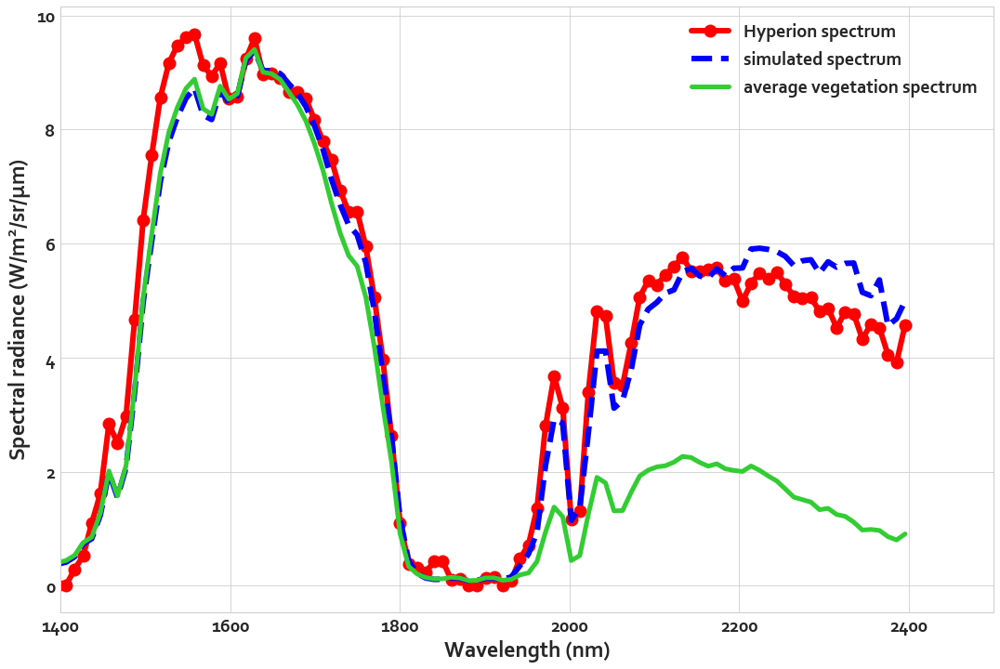

In [44]:
f, ax = plt.subplots(1, 1, figsize=(18, 12))
ax.set_xlabel("Wavelength (nm)", font)
ax.set_ylabel('Spectral radiance $(W / m^2 / sr / \mu m)$', font)
ax.set_xlim(1400, 2500)
#ax.set_ylim(0, 10)
 
ax.plot(swir_range, firespecs_SWIR[127, :], 
        'o-', color='red', linewidth=6, markersize=14, label='Hyperion spectrum')
ax.plot(swir_range, spec_2T(swir_range, 8, 5.9, 0.004, 0.054, .904), 
        '--', markersize=14, linewidth=6, color='b', label="simulated spectrum")
ax.plot(swir_range, avg_veg_SWir, '-', linewidth=5, markersize=14, color='limegreen', label="average vegetation spectrum")

ax.legend(loc=1)

**The following presumes Crazy fire**

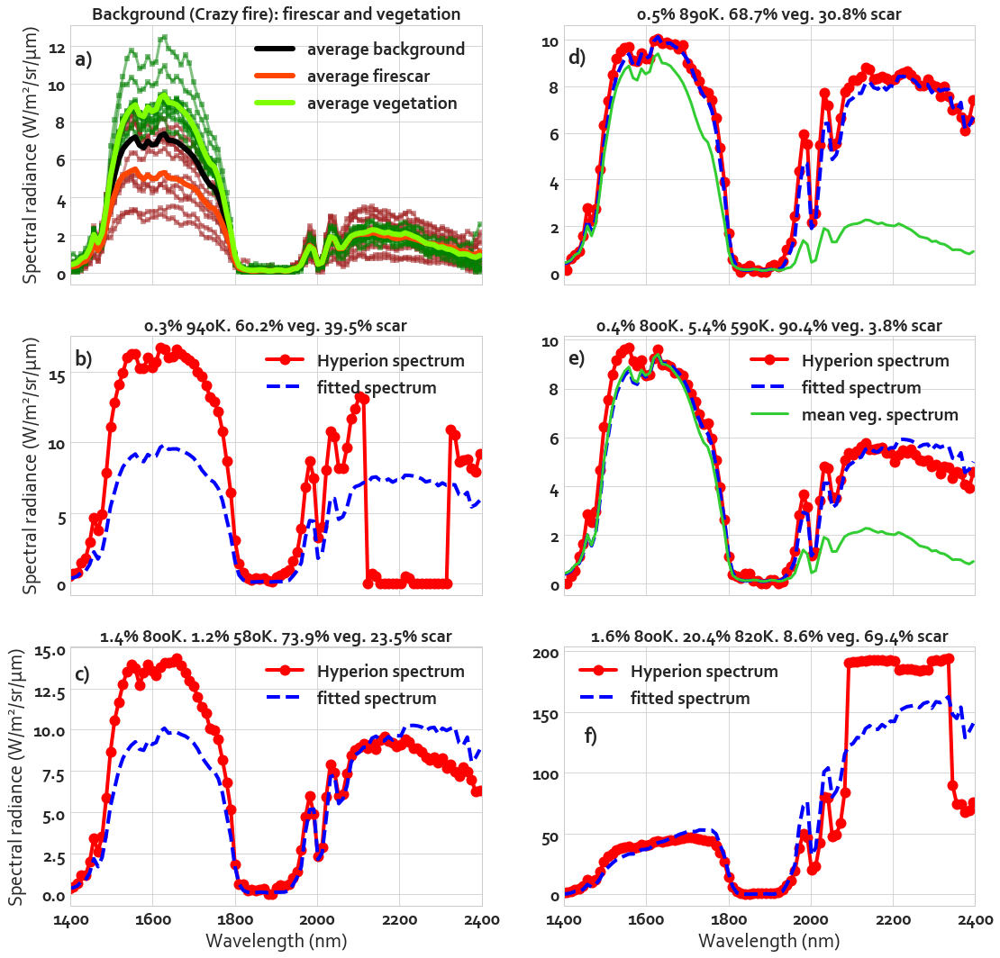

In [46]:
f, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, sharex=True, figsize=(18, 18))

for spec in scarsamplespecs_SWIR[:10, :]:
    ax1.plot(swir_range, spec, 's-', color='brown', linewidth=3, alpha=.5)  
for spec in vegsamplespecs_SWIR[:10, :]:
    ax1.plot(wav[98:], spec, 's-', color='green', linewidth=3, alpha=.5)  
ax1.plot(swir_range, avg_bg_SWir, linewidth=6, color='k', label='average background')
ax1.plot(swir_range, avg_scar_SWir, linewidth=6, color='orangered', label='average firescar')
ax1.plot(swir_range, avg_veg_SWir, linewidth=6, color='chartreuse', label='average vegetation')
ax1.set_title("Background (Crazy fire): firescar and vegetation", fontsize=20)
ax1.text(1410, 11, "a)", fontsize=24)

ax2.plot(swir_range, firespecs_SWIR[122, :], 
        'o-', color='red', linewidth=4, markersize=12, label='Hyperion spectrum')
ax2.plot(swir_range, spec_2T(swir_range, 8, 8.9, 0.0, 0.005, .687), 
        '--', markersize=14, linewidth=4, color='b', label="fitted spectrum")
ax2.plot(swir_range, avg_veg_SWir, '-', linewidth=3, color='limegreen', 
         label="mean veg. spectrum")
ax2.set_title("{:3.1f}% {:3.0f}K. {:3.1f}% veg. {:3.1f}% scar".format(
    0.5, 890., 68.7, 30.8), fontsize=20)
ax2.text(1410, 9, "d)", fontsize=24)

ax3.plot(swir_range, firespecs_SWIR[134, :], 
        'o-', color='red', linewidth=4, markersize=12, label='Hyperion spectrum')
ax3.plot(swir_range, spec_2T(swir_range, 8, 9.4, 0.00, 0.003, .602), 
        '--', markersize=14, linewidth=4, color='b', label="fitted spectrum")
ax3.set_title("{:3.1f}% {:3.0f}K. {:3.1f}% veg. {:3.1f}% scar".format(
    0.3, 940, 60.2, 39.5), fontsize=20)
ax3.text(1410, 15.5, "b)", fontsize=24)

ax4.plot(swir_range, firespecs_SWIR[127, :], 
        'o-', color='red', linewidth=4, markersize=12, label='Hyperion spectrum')
ax4.plot(swir_range, spec_2T(swir_range, 8, 5.9, 0.004, 0.054, .904), 
        '--', markersize=14, linewidth=4, color='b', label="fitted spectrum")
ax4.plot(swir_range, avg_veg_SWir, '-', linewidth=3, color='limegreen', 
         label="mean veg. spectrum")
ax4.set_title("{:3.1f}% {:3.0f}K. {:3.1f}% {:3.0f}K. {:3.1f}% veg. {:3.1f}% scar".format(
    0.4, 800., 5.4, 590, 90.4, 3.8), fontsize=20)
ax4.text(1410, 9, "e)", fontsize=24)

ax5.plot(swir_range, firespecs_SWIR[146, :], 
        'o-', color='red', linewidth=4, markersize=12, label='Hyperion spectrum')
ax5.plot(swir_range, spec_2T(swir_range, 8, 5.8, 0.014, 0.012, .739), 
        '--', markersize=14, linewidth=4, color='b', label="fitted spectrum")
ax5.set_title("{:3.1f}% {:3.0f}K. {:3.1f}% {:3.0f}K. {:3.1f}% veg. {:3.1f}% scar".format(
    1.4, 800., 1.2, 580, 73.9, 23.5), fontsize=20)
ax5.text(1410, 13.0, "c)", fontsize=24)

ax6.plot(swir_range, firespecs_SWIR[131, :], 
        'o-', color='red', linewidth=4, markersize=12, label='Hyperion spectrum')
ax6.plot(swir_range, spec_2T(swir_range, 8, 8.2, 0.016, 0.204, .086), 
        '--', markersize=14, linewidth=4, color='b', label="fitted spectrum")
ax6.set_title("{:3.1f}% {:3.0f}K. {:3.1f}% {:3.0f}K. {:3.1f}% veg. {:3.1f}% scar".format(
    1.6, 800., 20.4, 820, 8.6, 69.4), fontsize=20)
ax6.text(1450, 125, "f)", fontsize=24)

for ax in [ax1, ax2, ax3, ax4, ax5, ax6]:
    ax.set_xlim(1400, 2400)

for ax in [ax1, ax3, ax4, ax5, ax6]:
    ax.legend(loc=0)
    
for ax in [ax5, ax6]:
    ax.set_xlabel("Wavelength (nm)")
for ax in [ax1, ax3, ax5, ]:
    ax.set_ylabel('Spectral radiance $(W / m^2 / sr / \mu m)$')


In [47]:
outfn = 'Fig08_LR.png'
f.savefig(os.path.join(outdir, outfn), dpi=150, bb_inches='tight')

In [58]:
outfn = 'Fig08.jpg'
f.savefig(os.path.join(outdir, outfn), dpi=300, bb_inches='tight')

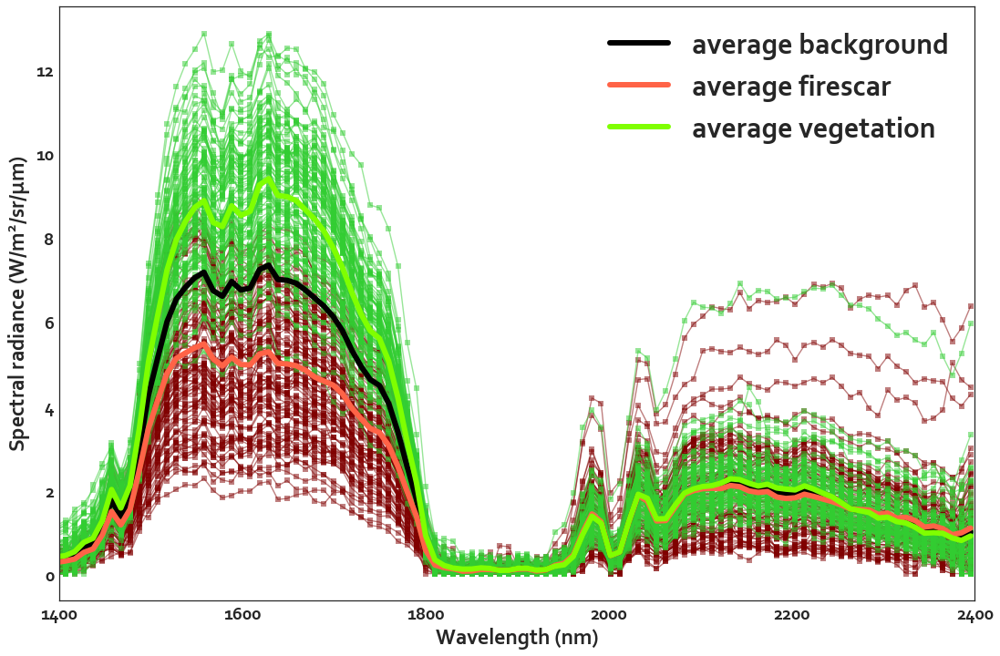

In [59]:
f, ax = plt.subplots(1, 1, figsize=(18, 12))
ax.set_xlabel("Wavelength (nm)", font)
ax.set_ylabel('Spectral radiance $(W / m^2 / sr / \mu m)$', font)
ax.set_xlim(1400, 2400)
#ax.set_ylim(0, 10)
for spec in scarsamplespecs_SWIR[:100, :]:
    ax.plot(swir_range, spec, 's-', color='maroon', alpha=.5)  
for spec in vegsamplespecs_SWIR[:100, :]:
    ax.plot(wav[98:], spec, 's-', color='limegreen', alpha=.5)  
ax.plot(swir_range, avg_bg_SWir, linewidth=6, color='k', label='average background')
ax.plot(swir_range, avg_scar_SWir, linewidth=6, color='tomato', label='average firescar')
ax.plot(swir_range, avg_veg_SWir, linewidth=6, color='chartreuse', label='average vegetation')
plt.legend(loc=1, prop={'size': 32})